In [14]:
import pandas as pd

# Read the .feather file
boardgames_file = './bgg_boardgames_top_2000.feather'
df_games = pd.read_feather(boardgames_file)

# Drop the column you want to remove
df_games.drop(columns=['comments', 'marketplace_history', 'description', 'expansions', 'thumbnail_link', 'image_link', 'publishers', 'honors', 'podcast_episodes','users_rated','average_rating','bayes_average_rating','median','stddev','owned','trading','wishing','num_of_comments','num_of_weights','average_weight','accessories','artists','designers','graphic_designers', 'ranks', 'suggested_numplayers'], inplace=True)

df_games.to_csv('boardgames.csv', index=False)

In [34]:
coopLabel = 'Cooperative Game'

class BoardGameRow:
    def __init__(self, row):
        self.id = row['boardgame_id']
        self.title = row['title']
        self.year = row['year_published']
        self.minPlayers = row['minplayers']
        self.maxPlayers = row['maxplayers']
        self.minplaytime = row['minplaytime']
        self.maxplaytime = row['maxplaytime']
        self.publisher = row['main_publisher']
        self.age = row['age']
        
        mehcanics = None
        if row['mechanics']: 
            mehcanics = [mechanic for mechanic in row['mechanics'].split('|') if row['mechanics']]
            self.mechanics = mehcanics
        
        self.coopGame = mehcanics and coopLabel in mehcanics

        if row['category']:
            self.categories = [category for category in row['category'].split('|') if row['category']]

        if row['subdomains']:
            self.main_categories = [subdomain for subdomain in row['subdomains'].split('|')]

    

    def __str__(self):
        attributes = ', '.join([f"{key}={value}" for key, value in self.__dict__.items()])
        return f"BoardGameRow({attributes})"
    
    def __repr__(self):
        return str(self)
    
    def get_id(self):
        return self.id

    def get_title(self):
        return self.title

    def get_year(self):
        return self.year

    def get_min_players(self):
        return self.minPlayers

    def get_max_players(self):
        return self.maxPlayers

    def get_min_playtime(self):
        return self.minplaytime

    def get_max_playtime(self):
        return self.maxplaytime

    def get_publisher(self):
        return self.publisher

    def get_age(self):
        return self.age

    def get_mechanics(self):
        return getattr(self, 'mechanics', None)

    def is_coop_game(self):
        return self.coopGame

    def get_categories(self):
        return getattr(self, 'categories', None)

    def get_main_categories(self):
        return getattr(self, 'main_categories', None)

In [16]:
import matplotlib.pyplot as plt

def make_graph(categories, values):

    # Ordena las categorías y los valores en función de los valores (grados) en orden descendente
    categories, values = zip(*sorted(zip(categories, values), key=lambda x: x[1], reverse=True))

    # Crear el gráfico de barras
    plt.bar(categories, values)

    # Añadir etiquetas y título
    plt.xlabel('Nodos')
    plt.ylabel('Grado')
    plt.title('Gráfico de Barras')

    # Rotar etiquetas del eje x
    plt.xticks(rotation=45)

    # Ajustar tamaño de la figura
    plt.gcf().set_size_inches(len(categories), 6)

    # Mostrar el gráfico
    plt.tight_layout()  # Ajustar automáticamente el diseño para evitar la superposición de elementos


    # Mostrar el gráfico
    plt.show()

""" def filter_field(field, attribute):
    main_categories = {}
    for id, gameInfo in gamesInfo.items():
        if gameInfo.get_main_categories():
            for main_category in gameInfo.get_main_categories():
                if main_category not in main_categories:
                    main_categories[main_category] = set()
                main_categories[main_category].add(id) """
        


In [35]:
gamesInfo = {}
for _, row in df_games.iterrows():
    gamesInfo[row['boardgame_id']] = BoardGameRow(row)


print(f'Games Info: {gamesInfo}')


Games Info: {77423: BoardGameRow(id=77423, title=The Lord of the Rings: The Card Game, year=2011, minPlayers=1, maxPlayers=2, minplaytime=30, maxplaytime=60, publisher=Fantasy Flight Games, age=13, mechanics=['Cooperative Game', 'Deck Construction', 'Events', 'Hand Management', 'Scenario / Mission / Campaign Game', 'Solo / Solitaire Game', 'Variable Set-up'], coopGame=True, categories=['Adventure', 'Card Game', 'Collectible Components', 'Fantasy', 'Novel-based'], main_categories=['Customizable Games']), 88: BoardGameRow(id=88, title=Torres, year=1999, minPlayers=2, maxPlayers=4, minplaytime=60, maxplaytime=60, publisher=F.X. Schmid, age=12, mechanics=['Action Points', 'Area Majority / Influence', 'Enclosure', 'Grid Movement', 'Hand Management', 'Square Grid', 'Three Dimensional Movement', 'Tile Placement'], coopGame=False, categories=['Abstract Strategy', 'Medieval'], main_categories=['Abstract Games', 'Strategy Games']), 203420: BoardGameRow(id=203420, title=Exit: The Game – The Aband

Cantidad de categorias principales distintas: 8


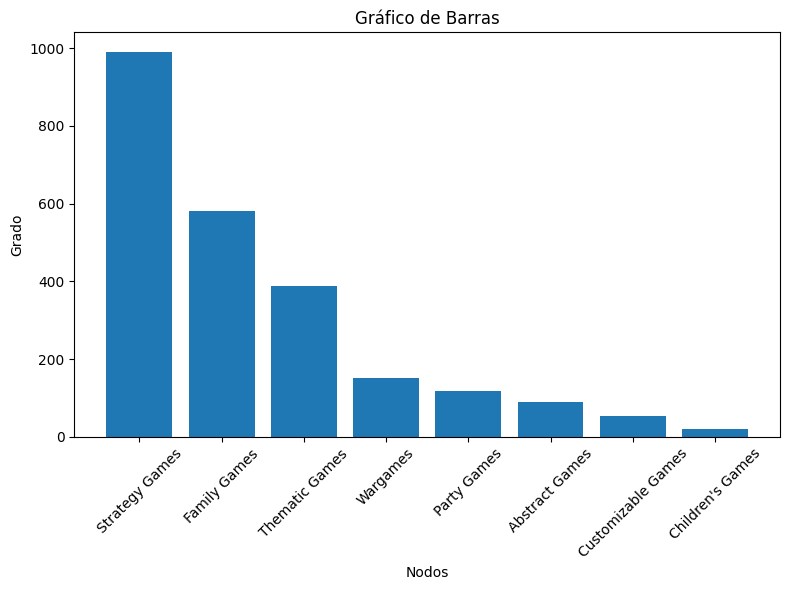

In [18]:
# Cantidad de main_categories distintas
main_categories = {}
for id, gameInfo in gamesInfo.items():
    if gameInfo.get_main_categories():
        for main_category in gameInfo.get_main_categories():
            if main_category not in main_categories:
                main_categories[main_category] = set()
            main_categories[main_category].add(id)
    
print(f'Cantidad de categorias principales distintas: {len(main_categories)}')
make_graph(list(main_categories.keys()), [len(x) for x in list(main_categories.values())])

Cantidad de categorias  distintas: 84


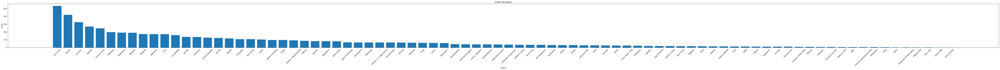

In [19]:
# Cantidad de categorias distintas
categories = {}
for id, gameInfo in gamesInfo.items():
    if gameInfo.get_categories():
        for category in gameInfo.get_categories():
            if category not in categories:
                categories[category] = set()
            categories[category].add(id)
    
print(f'Cantidad de categorias  distintas: {len(categories)}')
make_graph(list(categories.keys()), [len(x) for x in list(categories.values())])


Cantidad de mecanicas distintas: 186


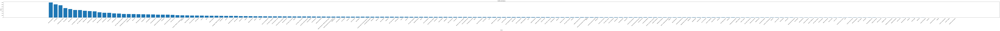

In [20]:
# Cantidad de mecanicas distintas
mechanics = {}
for id, gameInfo in gamesInfo.items():
    if gameInfo.get_mechanics():
        for mechanic in gameInfo.get_mechanics():
            if mechanic not in mechanics:
                mechanics[mechanic] = []
            mechanics[mechanic].append(id)
    
print(f'Cantidad de mecanicas distintas: {len(mechanics)}')
make_graph(list(mechanics.keys()), [len(x) for x in list(mechanics.values())])


In [ ]:
# Cantidad de mecanicas distintas
years = {}
for id, gameInfo in gamesInfo.items():
    if gameInfo.get_mechanics():
        for mechanic in gameInfo.get_mechanics():
            if mechanic not in years:
                years[mechanic] = []
            years[mechanic].append(id)
    
print(f'Cantidad de mecanicas distintas: {len(mechanics)}')
make_graph(list(mechanics.keys()), [len(x) for x in list(mechanics.values())])

In [39]:
print(f'La cantidad de juegos son: {len(df_games)}')

La cantidad de juegos son: 1999


In [38]:
df_games.head(5)


,boardgame_id,title,year_published,minplayers,maxplayers,minplaytime,maxplaytime,age,main_publisher,mechanics,category,subdomains,implementations
0,77423,The Lord of the Rings: The Card Game,2011,1,2,30,60,13,Fantasy Flight Games,Cooperative Game|Deck Construction|Events|Hand...,Adventure|Card Game|Collectible Components|Fan...,Customizable Games,The Lord of the Rings: The Card Game – Revised...
1,88,Torres,1999,2,4,60,60,12,F.X. Schmid,Action Points|Area Majority / Influence|Enclos...,Abstract Strategy|Medieval,Abstract Games|Strategy Games,Torres Family|Burgenland
2,203420,Exit: The Game – The Abandoned Cabin,2016,1,6,60,120,12,KOSMOS,Cooperative Game,Deduction|Puzzle|Real-time,Family Games|Thematic Games,None
3,310448,Zombie Teenz Evolution,2020,2,4,15,25,8,Le Scorpion Masqué,Action Points|Cooperative Game|Dice Rolling|Ev...,Children's Game|Zombies,Family Games,Zombie Kidz Evolution
4,25417,BattleLore,2006,2,2,60,60,10,Days of Wonder,Area Majority / Influence|Campaign / Battle Ca...,Fantasy|Medieval|Miniatures|Wargame,Thematic Games|Wargames,BattleLore: Second Edition|Battles of Westeros


## Hacemos cosas con el grafo


In [42]:
import pandas as pd

# Read the .feather file
ratings_file = './bgg_ratings_top_2000.feather'
df_ratings = pd.read_feather(ratings_file)

# Drop the column you want to remove
df_ratings.drop(columns=['comment', 'last_modified', 'prevowned','fortrade','want','wanttoplay','wanttobuy','wishlist','preordered'], inplace=True)

print(f'Termino la carga del archivo y tiene {len(df_ratings)} filas')

Termino la carga del archivo y tiene 1003471 filas


In [43]:
df_ratings.head(5)

,nickname,title,boardgame_id,rating,num_of_plays,own
0,happyjosiah,5-Minute Dungeon,207830,7.0,2,0
1,happyjosiah,6 nimmt!,432,7.0,8,0
2,happyjosiah,7 Wonders,68448,8.0,41,1
3,happyjosiah,7 Wonders Duel,173346,5.0,1,0
4,happyjosiah,Acquire,5,9.0,11,1


In [22]:
# Group boardgames_ids by nicknames
nickNames = {}
i = 0
titles = {}
for _, row in df_ratings.iterrows():
    nickName = row['nickname']
    boardgameId = row['boardgame_id']
    title = row['title']
    rating = row['rating']
    own = row['own']
    numPlays = row['num_of_plays']

    if (rating > 9.0 and numPlays >= 10):
        i += 1
        if boardgameId not in titles:
            titles[boardgameId] = title
        if nickName not in nickNames:
            nickNames[nickName] = set()
        nickNames[nickName].add((boardgameId))

print(f'La cantidad de filas es: {i}')
print(f'Los titulos distintos son: {len(titles)}')

La cantidad de filas es: 8927
Los titulos distintos son: 1207


In [44]:
boardgamesData = {}
#j = 0
for nickName, boardgames in nickNames.items():
    """ if len(boardgames) < 2:
        j += 1
        continue """
    for boardgame in boardgames:
        otherBoardGames  = [otherBoardGame for otherBoardGame in boardgames if otherBoardGame != boardgame]
        if boardgame not in boardgamesData:
            boardgamesData[boardgame] = otherBoardGames
        else: 
            for otherBoardGame in otherBoardGames: 
                if otherBoardGame not in boardgamesData[boardgame]:
                    boardgamesData[boardgame] += [otherBoardGame]
print(f'{len(boardgamesData.keys())}')
#print(f'La cantidad de jugadores que solo cumplen con 1 juego son: {j}')

1207


In [45]:
import networkx as nx
rows = []
boardgame_already_use = {}
nx_graph = nx.Graph()

for boardgame, relatedBoardGames in boardgamesData.items():
    boardgame_already_use[boardgame] = True
    nx_graph.add_node(boardgame, name=titles[boardgame])
    for relatedBoardGame in relatedBoardGames:
        if relatedBoardGame in boardgame_already_use and boardgame in boardgamesData[relatedBoardGame]:
            continue
        else:
            rows.append((titles[boardgame], titles[relatedBoardGame]))
            nx_graph.add_edge(boardgame, relatedBoardGame)

In [25]:
import csv

# Escribir las filas en un archivo CSV
with open('boardgame_otherboardgame2.csv', 'w', newline='') as archivo_csv:
    escritor_csv = csv.writer(archivo_csv)
    escritor_csv.writerow(['Source', 'Target'])  # Escribir encabezados
    escritor_csv.writerows(rows)  # Escribir las filas

# Calculos con NetworkX

In [26]:
import math

#Obtenemos el grado promedio
average_degree = sum(dict(nx_graph.degree()).values()) / len(nx_graph)
print(f'Average degree: {math.ceil(average_degree)}')

Average degree: 79


In [27]:
clustering_coefficient = nx.average_clustering(nx_graph)
print(f'Clustering coefficient: {round(clustering_coefficient, 2)}')

Clustering coefficient: 0.72


In [28]:
from networkx.algorithms.community import greedy_modularity_communities
import matplotlib.pyplot as plt

# Detectar comunidades utilizando el algoritmo de modularity
communities = list(greedy_modularity_communities(nx_graph))


length_communities = len(communities)
print(f'La cantidad de comunidades es: {length_communities}')
for i in range(length_communities):
    print(f'La cantidad de nodos en la comunidad {i + 1} es: {len(communities[i])}')

La cantidad de comunidades es: 13
La cantidad de nodos en la comunidad 1 es: 587
La cantidad de nodos en la comunidad 2 es: 456
La cantidad de nodos en la comunidad 3 es: 129
La cantidad de nodos en la comunidad 4 es: 7
La cantidad de nodos en la comunidad 5 es: 6
La cantidad de nodos en la comunidad 6 es: 5
La cantidad de nodos en la comunidad 7 es: 5
La cantidad de nodos en la comunidad 8 es: 4
La cantidad de nodos en la comunidad 9 es: 3
La cantidad de nodos en la comunidad 10 es: 2
La cantidad de nodos en la comunidad 11 es: 1
La cantidad de nodos en la comunidad 12 es: 1
La cantidad de nodos en la comunidad 13 es: 1


In [29]:
subgraph = nx.Graph()
community_nodes = list(communities[1])
subgraph.add_nodes_from([(node, {"name": titles[node]}) for node in community_nodes])

for node1 in community_nodes:
    for node2 in community_nodes:
        if node1 != node2 and nx_graph.has_edge(node1, node2):
            subgraph.add_edge(node1, node2)


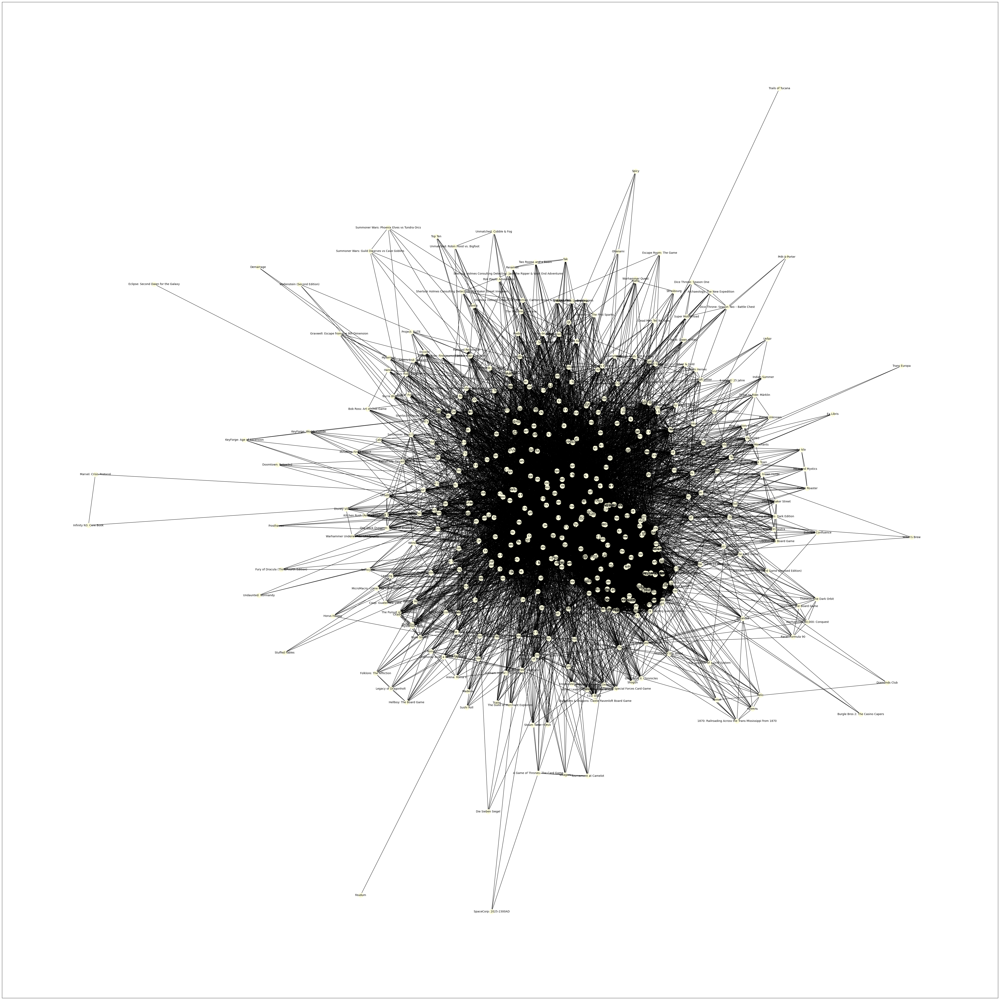

In [30]:
labels = dict([(node, titles[node]) for node in list(subgraph.nodes)])
plt.figure(figsize=(50, 50))
pos = nx.spring_layout(subgraph)
nx.draw_networkx(subgraph, pos, labels=labels,  with_labels=True, node_color='lightyellow', font_size=10)


# Mostrar el gráfico
plt.tight_layout()  # Ajustar automáticamente el diseño para evitar la superposición de elementos


plt.show()

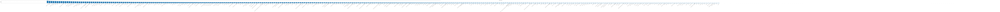

In [31]:
degrees = dict(subgraph.degree())

# Datos
categorias = list([titles[node] for node in list(degrees.keys())])
valores = list(degrees.values())

# Ordena las categorías y los valores en función de los valores (grados) en orden descendente
categorias, valores = zip(*sorted(zip(categorias, valores), key=lambda x: x[1], reverse=True))

# Crear el gráfico de barras
plt.bar(categorias, valores)

# Añadir etiquetas y título
plt.xlabel('Nodos')
plt.ylabel('Grado')
plt.title('Gráfico de Barras')

# Rotar etiquetas del eje x
plt.xticks(rotation=45)

# Ajustar tamaño de la figura
plt.gcf().set_size_inches(len(categorias), 6)

# Mostrar el gráfico
plt.tight_layout()  # Ajustar automáticamente el diseño para evitar la superposición de elementos


# Mostrar el gráfico
plt.show()

In [32]:
import networkx as nx
# Encontrar los puentes en el grafo
bridges = list(nx.bridges(nx_graph))

print("Puentes en la red:")
for bridge in bridges:
    graph_copy = nx_graph.copy()
    graph_copy.remove_edge(*bridge)
    
    # Verificar si la eliminación de la arista dividió la red en componentes disjuntas
    components = list(nx.connected_components(graph_copy))
    if len(components) == 1:
        print(f"Puente global: {titles[bridge[0]], titles[bridge[1]]}")
    else:
        print(f"Puente local: {titles[bridge[0]], titles[bridge[1]]}")

Puentes en la red:
Puente local: ('Terraforming Mars', 'Ashes Reborn: Rise of the Phoenixborn')
Puente local: ('Through the Ages: A Story of Civilization', 'Pax Renaissance: 2nd Edition')
Puente local: ('Ark Nova', 'Wasteland Express Delivery Service')
Puente local: ('Pax Renaissance', 'Advanced Squad Leader: Starter Kit #1')


In [33]:
# Step 1: Read CSV file into DataFrame
csv_file = './boardgamesCommunities.csv'
df_communities = pd.read_csv(csv_file)

gamesInfo = {}

df_result = pd.merge(df_communities, df_games, on='title')

for _, row in df_result.iterrows():
    gamesInfo[row['boardgame_id']] = BoardGameRow(row)

    

gamesInfo.items()
print(len(df_games))
print(len(df_result))
print(len(df_communities))



    

#Cantidad de nodos  -- 1146 
#Cantidad de aristas -- 40715
#Diametro -- 4
#Grado promedio -- 71
#Coeficiente de clustering  -- 0.724
#Puentes globales y locales
#Analisis de centralidad
#Comunidades  --  4
#Homofilia
#Roles
#Motifs






1999
1103
1146
